[![Open In Collab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1uOZSDEmf1WMye_xmRTG6x-Tg-9jrZ17o?usp=sharing)

In [1]:
!pip install transformers
!pip install datasets
!pip install transformers[torch] accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 48.2 MB/s eta 0:00:00
  Attempting uninstall: transformers
    Found existing installation: transformers 4.56.2
    Uninstalling transformers-4.56.2:
      Successfully uninstalled transformers-4.56.2


In [2]:
from datasets import load_dataset

In [3]:
ds = load_dataset('Asseh/Vehicle_Classification')
ds

vehicel_classification.zip:   0%|          | 0.00/166M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/400 [00:00<?, ? examples/s]

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 400
    })
})

#### Apply transfer learning so that GradCam techniques can be applied and visualized well

In [7]:
from datasets import DatasetDict
import random
from torchvision import transforms as T
from torch.utils.data import DataLoader
from torchvision.models import resnet50, ResNet50_Weights
import torch.nn as nn
import torch.optim as optim
import torch

random.seed(42)

# Make train and validation sets with indices
all_indices = list(range(len(ds['train'])))
train_indices = random.sample(all_indices, 300)
remaining_indices = list(set(all_indices) - set(train_indices))
validation_indices = random.sample(remaining_indices, 100)

train_ds = ds['train'].select(train_indices)
validation_ds = ds['train'].select(validation_indices)

num_classes = len(train_ds.features["label"].names)
print(f"Number of classes: {num_classes}")

# Simple transformations
train_transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.RandomHorizontalFlip(),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

def train_transform_func(example):
    images = [img.convert('RGB') for img in example["image"]]
    transformed_images = [train_transform(img) for img in images]
    return {"image": torch.stack(transformed_images), "label": example["label"]}

def val_transform_func(example):
    images = [img.convert('RGB') for img in example["image"]]
    transformed_images = [val_transform(img) for img in images]
    return {"image": torch.stack(transformed_images), "label": example["label"]}

train_ds = train_ds.with_transform(train_transform_func)
validation_ds = validation_ds.with_transform(val_transform_func)

batch_size = 32
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(validation_ds, batch_size=batch_size, shuffle=False)

# Load ResNet50 with pretrained weights
model = resnet50(weights=ResNet50_Weights.IMAGENET1K_V1)

# Freeze all layers except the final fully connected layer
for param in model.parameters():
    param.requires_grad = False

# Replace final layer
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Move to device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = model.to(device)

# Loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=0.005)

# Training loop
epochs = 10
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for batch in train_loader:
        images, labels = batch["image"].to(device), batch["label"].to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    train_acc = 100 * correct / total
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(train_loader):.4f}, Train Acc: {train_acc:.2f}%")

    # Validation
    model.eval()
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for batch in val_loader:
            images, labels = batch["image"].to(device), batch["label"].to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_acc = 100 * val_correct / val_total
    print(f"Validation Acc: {val_acc:.2f}%")

print("Training complete!")

Number of classes: 4


/usr/local/lib/python3.12/dist-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1/10, Loss: 1.5226, Train Acc: 52.67%
Validation Acc: 85.00%
Epoch 2/10, Loss: 0.5020, Train Acc: 82.00%
Validation Acc: 82.00%
Epoch 3/10, Loss: 0.2969, Train Acc: 88.67%
Validation Acc: 93.00%
Epoch 4/10, Loss: 0.1344, Train Acc: 95.00%
Validation Acc: 93.00%
Epoch 5/10, Loss: 0.1165, Train Acc: 95.67%
Validation Acc: 93.00%
Epoch 6/10, Loss: 0.1617, Train Acc: 93.33%
Validation Acc: 93.00%
Epoch 7/10, Loss: 0.1439, Train Acc: 93.33%
Validation Acc: 90.00%
Epoch 8/10, Loss: 0.1235, Train Acc: 95.33%
Validation Acc: 93.00%
Epoch 9/10, Loss: 0.1238, Train Acc: 96.67%
Validation Acc: 93.00%
Epoch 10/10, Loss: 0.0910, Train Acc: 96.67%
Validation Acc: 95.00%
Training complete!


In [14]:
model.state_dict()

OrderedDict([('conv1.weight',
              tensor([[[[ 1.3335e-02,  1.4664e-02, -1.5351e-02,  ..., -4.0896e-02,
                         -4.3034e-02, -7.0755e-02],
                        [ 4.1205e-03,  5.8477e-03,  1.4948e-02,  ...,  2.2060e-03,
                         -2.0912e-02, -3.8517e-02],
                        [ 2.2331e-02,  2.3595e-02,  1.6120e-02,  ...,  1.0281e-01,
                          6.2641e-02,  5.1977e-02],
                        ...,
                        [-9.0349e-04,  2.7767e-02, -1.0105e-02,  ..., -1.2722e-01,
                         -7.6604e-02,  7.8453e-03],
                        [ 3.5894e-03,  4.8006e-02,  6.2051e-02,  ...,  2.4267e-02,
                         -3.3662e-02, -1.5709e-02],
                        [-8.0029e-02, -3.2238e-02, -1.7808e-02,  ...,  3.5359e-02,
                          2.2439e-02,  1.7077e-03]],
              
                       [[-1.8452e-02,  1.1415e-02,  2.3850e-02,  ...,  5.3736e-02,
                          4.4022

In [ ]:
# to save
# torch.save(model.state_dict(), 'resnet50_vehicle_finetuned.pth')
# print("Model saved as 'resnet50_vehicle_finetuned.pth'")

What the image set contains

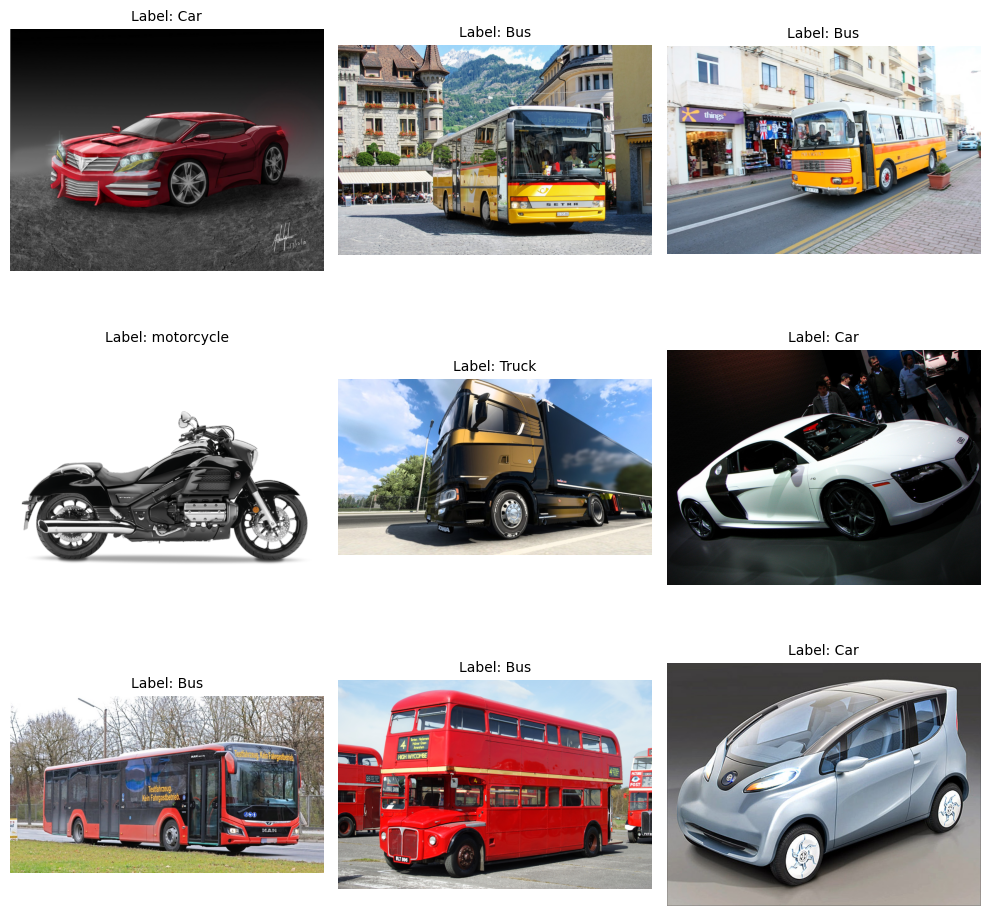

In [8]:
import random
from datasets import load_dataset
import matplotlib.pyplot as plt

def display_random_images_with_labels(dataset, num_images=9, max_index=400):
    # Generate random indices
    random_indices = random.sample(range(max_index), num_images)

    # Set up the plot
    fig, axs = plt.subplots(3, 3, figsize=(10, 10))

    for idx, ax in zip(random_indices, axs.flatten()):
        entry = dataset['train'][idx]
        image = entry['image']
        label_id = entry['label']
        label_name = dataset['train'].features['label'].int2str(label_id)

        # Display the image
        ax.imshow(image)
        ax.set_title(f'Label: {label_name}', fontsize=10)
        ax.axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Display 9 random images with their labels in a 3x3 grid
display_random_images_with_labels(ds, num_images=9, max_index=400)

[referred to the github repo: github.com/shyhyawJou/GradCAM-pytorch/blob/main/cam.py for the idea of base GradCam class. Some modifications were made, such as image transformation

In [75]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import cv2
import numpy as np
from PIL import Image
import torchvision.transforms as T


class CAM:
    """
    Base class for CAM methods with hook management.
    """
    def __init__(self, model, device, preprocess, layer_name=None):
        self.model = model
        self.device = device
        self.prep = preprocess
        self.layer_name = layer_name
        self.feature = {}
        self.gradient = {}
        self._register_hooks()
        self.model.eval()

    def _register_hooks(self):
        """Register forward and backward hooks for feature extraction."""
        def forward_hook(module, input, output):
            self.feature['output'] = output

        def backward_hook(module, grad_input, grad_output):
            self.gradient['value'] = grad_output[0]

        # Find the target layer
        target_layer = self._find_layer()
        if target_layer is None:
            raise ValueError(f"Could not find suitable layer. Tried: {self.layer_name}")

        # Register hooks
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_full_backward_hook(backward_hook)

        self.target_layer = target_layer
        print(f"✓ Hooks registered on layer: {self.layer_name}")

    def _find_layer(self):
        """Find the target layer in the model."""
        if self.layer_name is None:
            # Auto-detect last conv layer
            for name, module in self.model.named_modules():
                if isinstance(module, nn.Conv2d) and 'fc' not in name and 'classifier' not in name:
                    last_conv = (name, module)
            if last_conv:
                self.layer_name = last_conv[0]

        # Find exact layer
        for name, module in self.model.named_modules():
            if name == self.layer_name:
                return module

        # Try partial match for ResNet
        for name, module in self.model.named_modules():
            if self.layer_name in name and isinstance(module, nn.Conv2d):
                self.layer_name = name  # Update to exact name
                return module

        return None

    def _check(self, feature):
        """Validate feature map shape."""
        if feature.ndim != 4:
            raise ValueError(f'Expected 4D feature map, got {feature.ndim}D: {feature.shape}')
        if feature.shape[1] < 1:
            raise ValueError(f'Feature map has no channels: {feature.shape}')

    def prep(self, img):
        """Preprocess image."""
        if isinstance(img, Image.Image):
            return self.prep(img)
        return img

    def get_heatmap(self, img):
        """Base method - must be implemented by subclasses."""
        raise NotImplementedError("Subclasses must implement get_heatmap")


class GradCAM(CAM):
    """
    Standard GradCAM implementation.
    """
    def __init__(self, model, device, preprocess, layer_name=None):
        super().__init__(model, device, preprocess, layer_name)

    def get_heatmap(self, img):
        """
        Generate GradCAM heatmap.
        """
        # Clear previous hooks
        self.feature.clear()
        self.gradient.clear()

        # Forward pass
        tensor = self.prep(img)[None, ...].to(self.device)
        output = self.model(tensor)

        if 'output' not in self.feature:
            raise RuntimeError("Forward hook not triggered")

        feature = self.feature['output']
        self._check(feature)

        # Get target class
        target_class = output.argmax(dim=1).item()

        # Backward pass
        self.model.zero_grad()
        class_score = output[0, target_class]
        class_score.backward()

        if 'value' not in self.gradient:
            raise RuntimeError("Backward hook not triggered")

        gradients = self.gradient['value']

        # GradCAM computation
        with torch.no_grad():
            feature_maps = feature[0]  # [C, H, W]
            gradients_maps = gradients[0]  # [C, H, W]

            # Global average pooling of gradients
            weights = torch.mean(gradients_maps, dim=[1, 2])  # [C]
            weights = F.relu(weights)

            if weights.sum() > 0:
                weights = weights / weights.sum()

            # Weighted sum of feature maps
            weighted_features = feature_maps * weights.view(-1, 1, 1)
            cam = torch.sum(weighted_features, dim=0)  # [H, W]

            # Post-process
            cam = F.relu(cam)
            if cam.max() > 0:
                cam = cam / cam.max()

            cam_np = cam.cpu().numpy()
            cam_uint8 = np.uint8(255 * cam_np)

            overlay = self._create_overlay(cam_uint8, img)

        # Cleanup
        self.model.zero_grad()
        self.feature.clear()
        self.gradient.clear()

        return output.detach(), overlay

    def _create_overlay(self, cam_uint8, img):
        """Same overlay creation as GradCAM++."""
        orig_width, orig_height = img.size
        cam_resized = cv2.resize(cam_uint8, (orig_width, orig_height))
        cam_colored = cv2.applyColorMap(cam_resized, cv2.COLORMAP_JET)
        cam_rgb = cv2.cvtColor(cam_colored, cv2.COLOR_BGR2RGB)

        img_np = np.array(img)
        if len(img_np.shape) == 2:
            img_np = cv2.cvtColor(img_np, cv2.COLOR_GRAY2RGB)
        elif img_np.shape[2] == 4:
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)

        if img_np.dtype != np.uint8:
            if img_np.max() <= 1.0:
                img_np = (img_np * 255).astype(np.uint8)
            else:
                img_np = np.clip(img_np, 0, 255).astype(np.uint8)

        if cam_rgb.shape[:2] != img_np.shape[:2]:
            cam_rgb = cv2.resize(cam_rgb, (img_np.shape[1], img_np.shape[0]))

        overlay = 0.6 * img_np.astype(np.float32) + 0.4 * cam_rgb.astype(np.float32)
        overlay = np.clip(overlay, 0, 255).astype(np.uint8)

        return overlay

[Used Grok 4 Fast to generate the gradcam computation of the get_heatmap() function and the modification of the _create_overlay() at 5:28 pm October 3rd]

In [102]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
from PIL import Image

class GradCAMPlusPlus(CAM):
    """
    GradCAM++ implementation with robust second-order gradient computation.
    """
    def __init__(self, model, device, preprocess, layer_name=None):
        super().__init__(model, device, preprocess, layer_name)

    def get_heatmap(self, img):
        """
        Generate GradCAM++ heatmap with computation and fallbacks.
        """
        # Clear previous hooks
        self.feature.clear()
        self.gradient.clear()

        # Forward pass
        tensor = self.prep(img)[None, ...].to(self.device)
        output = self.model(tensor)

        if 'output' not in self.feature:
            raise RuntimeError("Forward hook not triggered")

        feature = self.feature['output']
        self._check(feature)

        # Get target class
        target_class = output.argmax(dim=1).item()

        # Backward pass for first-order gradients
        self.model.zero_grad()
        class_score = output[0, target_class]
        class_score.backward()

        if 'value' not in self.gradient:
            raise RuntimeError("Backward hook not triggered")

        gradients = self.gradient['value']

        # GradCAM++ computation
        with torch.no_grad():
            feature_maps = feature[0]  # [C, H, W]
            gradients_maps = gradients[0]  # [C, H, W]

            # Apply ReLU to gradients to focus on positive contributions
            gradients_maps_relu = F.relu(gradients_maps)

            # Compute alpha weights using the proper GradCAM++ formulation
            alpha = torch.zeros(gradients_maps.size(0), device=gradients_maps.device)

            for k in range(gradients_maps.size(0)):
                grad_k = gradients_maps_relu[k]  # [H, W] - positive gradients only

                # Skip if no positive gradients for this channel
                if torch.sum(grad_k) == 0:
                    continue

                # Compute the necessary sums
                grad_sum = torch.sum(grad_k)  # sum of gradients with respect to A
                grad_sq_sum = torch.sum(grad_k ** 2)  # sum of (gradients with respect to A)**2
                grad_cu_sum = torch.sum(grad_k ** 3)  # Σ sum of (gradients with respect to A)**3

                # GradCAM++ weight computation
                denominator = grad_sum * grad_sq_sum
                if denominator > 1e-8:  # Avoid division by very small numbers
                    alpha[k] = grad_cu_sum / denominator
                else:
                    # If denominator is too small, use a fallback
                    alpha[k] = grad_sum / (grad_sq_sum + 1e-8)

            # Apply ReLU to ensure only positive contributions
            alpha = F.relu(alpha)

            # If alpha weights are problematic, use standard GradCAM
            if alpha.sum() == 0 or torch.isnan(alpha).any() or torch.isinf(alpha).any():
                # Standard GradCAM: global average pooling of gradients
                alpha = torch.mean(gradients_maps_relu, dim=[1, 2])
                alpha = F.relu(alpha)

            # Normalize alpha weights
            alpha_sum = alpha.sum()
            if alpha_sum > 1e-8:
                alpha_normalized = alpha / alpha_sum
            else:
                # If all alphas are still zero, use standard GradCAM normalization
                alpha_normalized = torch.mean(gradients_maps_relu, dim=[1, 2])
                alpha_normalized = F.relu(alpha_normalized)
                alpha_sum = alpha_normalized.sum()
                if alpha_sum > 1e-8:
                    alpha_normalized = alpha_normalized / alpha_sum
                else:
                    # Final fallback: uniform weights
                    alpha_normalized = torch.ones_like(alpha) / len(alpha)

            # Compute weighted feature maps
            alpha_expanded = alpha_normalized.view(-1, 1, 1)  # [C, 1, 1]
            weighted_features = feature_maps * alpha_expanded  # [C, H, W]

            # Sum over channels to get CAM
            cam = torch.sum(weighted_features, dim=0)  # [H, W]

            # Apply ReLU to focus on positive contributions
            cam = F.relu(cam)

            # Normalize CAM to [0, 1]
            cam_max = cam.max()
            if cam_max > 1e-8:
                cam_normalized = cam / cam_max
            else:
                # Create a simple center-weighted heatmap as fallback
                h, w = cam.shape
                y, x = torch.meshgrid(
                    torch.arange(h, dtype=torch.float32, device=cam.device),
                    torch.arange(w, dtype=torch.float32, device=cam.device),
                    indexing='ij'
                )
                center_y, center_x = h / 2, w / 2
                distance = torch.sqrt((y - center_y)**2 + (x - center_x)**2)
                cam_normalized = 1 - (distance / torch.max(distance))

            # Convert to numpy
            cam_np = cam_normalized.cpu().numpy()

            # Check for uniformity and enhance contrast if needed
            cam_std = np.std(cam_np)
            if cam_std < 1e-3:
                # Enhance contrast
                cam_np = (cam_np - np.min(cam_np)) / (np.max(cam_np) - np.min(cam_np) + 1e-8)
                # Add small Gaussian noise to break perfect uniformity
                noise = np.random.normal(0, 0.05, cam_np.shape)
                cam_np = np.clip(cam_np + noise, 0, 1)

            # Convert to uint8 for visualization
            cam_uint8 = np.uint8(255 * cam_np)

            overlay = self._create_overlay(cam_uint8, img)

        # Cleanup
        self.model.zero_grad()
        self.feature.clear()
        self.gradient.clear()

        return output.detach(), overlay

    def _create_overlay(self, cam_uint8, img):
        """
        Enhanced overlay creation with better visualization parameters.
        """
        orig_width, orig_height = img.size
        cam_resized = cv2.resize(cam_uint8, (orig_width, orig_height))

        # Apply JET colormap
        cam_colored = cv2.applyColorMap(cam_resized, cv2.COLORMAP_JET)
        cam_rgb = cv2.cvtColor(cam_colored, cv2.COLOR_BGR2RGB)

        # Prepare original image
        img_np = np.array(img)

        # Handle different image formats
        if len(img_np.shape) == 2:  # Grayscale
            img_np = cv2.cvtColor(img_np, cv2.COLOR_GRAY2RGB)
        elif img_np.shape[2] == 4:  # RGBA
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)

        # Normalize image to uint8
        if img_np.dtype != np.uint8:
            if img_np.max() <= 1.0:
                img_np = (img_np * 255).astype(np.uint8)
            else:
                img_np = np.clip(img_np, 0, 255).astype(np.uint8)

        # Ensure shapes match
        if cam_rgb.shape[:2] != img_np.shape[:2]:
            cam_rgb = cv2.resize(cam_rgb, (img_np.shape[1], img_np.shape[0]))

        # Create overlay with adjustable blending
        alpha_img = 0.3  # Original image weight
        alpha_cam = 0.7  # CAM weight
        overlay = alpha_img * img_np.astype(np.float32) + alpha_cam * cam_rgb.astype(np.float32)
        overlay = np.clip(overlay, 0, 255).astype(np.uint8)

        return overlay

[Used Grok 4 fast to modify and adapt the class for EigenCam at 4:13pm October 4th]

In [106]:
import torch
import torch.nn.functional as F
import numpy as np
from scipy.linalg import eigh
import cv2
from PIL import Image
import torchvision.transforms as T

class EigenCAM(CAM):
    """
    EigenCAM: implementation using eigenvectors of feature map covariance.
    Focuses on spatial variance captured by principal components.
    """
    def __init__(self, model, device, preprocess, layer_name=None, n_components=1):
        super().__init__(model, device, preprocess, layer_name)
        self.n_components = n_components
        self.target_layer = None
        self.feature_maps = None
        self.hook_handle = None
        self._initialize_target_layer(layer_name)

    def _initialize_target_layer(self, layer_name):
        """Initialize the target layer during object creation."""
        self.target_layer = self._find_layer(layer_name)

    def _find_layer(self, layer_name=None):
        """Find the target layer for feature extraction."""
        if layer_name is None:
            if hasattr(self.model, 'layer4') and isinstance(self.model.layer4, torch.nn.Sequential):
                try:
                    return self.model.layer4[2].conv3
                except (AttributeError, IndexError):
                    for i, block in enumerate(self.model.layer4):
                        if hasattr(block, 'conv3'):
                            return block.conv3
                    for block in reversed(self.model.layer4):
                        for attr_name in ['conv3', 'conv2', 'conv1']:
                            if hasattr(block, attr_name):
                                return getattr(block, attr_name)
            elif hasattr(self.model, 'features') and isinstance(self.model.features, torch.nn.Sequential):
                for layer in reversed(self.model.features):
                    if isinstance(layer, torch.nn.Conv2d):
                        return layer
            else:
                for name, module in reversed(list(self.model.named_modules())):
                    if isinstance(module, torch.nn.Conv2d):
                        return module
                raise ValueError("No suitable convolutional layer found in model")
        else:
            for name, module in self.model.named_modules():
                if name == layer_name:
                    if isinstance(module, torch.nn.Conv2d):
                        return module
                    else:
                        return module
            raise ValueError(f"Layer '{layer_name}' not found in model")

    def _clear_hooks(self):
        """Safely clear any existing hooks on the target layer."""
        if self.target_layer is not None and hasattr(self.target_layer, '_forward_hooks'):
            current_hooks = list(self.target_layer._forward_hooks.values())
            for hook in current_hooks:
                if hasattr(hook, 'remove'):
                    try:
                        hook.remove()
                    except RuntimeError:
                        pass
            self.target_layer._forward_hooks.clear()

    def _register_forward_hook(self):
        """Register forward hook to capture feature maps."""
        self._clear_hooks()

        def forward_hook(module, input, output):
            if isinstance(output, torch.Tensor):
                self.feature_maps = output
            elif isinstance(output, tuple):
                self.feature_maps = output[0] if len(output) > 0 else None
            elif isinstance(output, dict):
                if 'output' in output:
                    self.feature_maps = output['output']
                else:
                    self.feature_maps = list(output.values())[0] if output else None
            else:
                self.feature_maps = None

        try:
            self.hook_handle = self.target_layer.register_forward_hook(forward_hook)
            return self.hook_handle
        except Exception:
            return None

    def get_heatmap(self, img):
        """
        Generate EigenCAM heatmap using eigenvector analysis.
        """
        self.feature_maps = None
        self.hook_handle = None

        hook_handle = self._register_forward_hook()
        if hook_handle is None:
            raise RuntimeError("Failed to register forward hook")

        try:
            # Forward pass
            tensor = self.prep(img)[None, ...].to(self.device)
            output = self.model(tensor)

            if self.feature_maps is None:
                raise RuntimeError("Forward hook not triggered")

            feature = self.feature_maps
            self._check(feature)

            with torch.no_grad():
                # Ensure batch dimension
                if feature.dim() == 3:
                    feature = feature.unsqueeze(0)

                batch_size, num_channels, height, width = feature.shape
                if batch_size != 1:
                    feature = feature[0:1]

                # Standard EigenCAM - Covariance of spatial locations
                # Treat each spatial location as a sample, channels as features
                num_spatial = height * width
                feature_reshaped = feature.permute(0, 2, 3, 1).reshape(1, num_spatial, num_channels)
                feature_flat = feature_reshaped[0].cpu().numpy()  # [H*W, C]

                if num_spatial < num_channels:
                    # Fallback: Use channel activation strength when spatial locations < channels
                    # Compute the L2 norm of each spatial location across all channels
                    spatial_norms = np.linalg.norm(feature_flat, axis=1)  # [H*W]
                    heatmap = spatial_norms.reshape(height, width)
                else:
                    # Compute covariance matrix: [C, C]
                    # Center the data (subtract mean across spatial locations)
                    feature_centered = feature_flat - np.mean(feature_flat, axis=0)

                    # Compute covariance: channels x channels
                    covariance = np.cov(feature_centered.T, rowvar=False)

                    if np.allclose(covariance, 0) or np.isnan(covariance).any():
                        # Fallback: use activation norms
                        spatial_norms = np.linalg.norm(feature_flat, axis=1)
                        heatmap = spatial_norms.reshape(height, width)
                    else:
                        # Eigenvalue decomposition
                        try:
                            covariance_reg = covariance + np.eye(covariance.shape[0]) * 1e-8
                            eigenvalues, eigenvectors = eigh(covariance_reg)

                            # Sort by descending eigenvalues
                            idx = np.argsort(eigenvalues)[::-1]
                            eigenvalues = eigenvalues[idx]
                            eigenvectors = eigenvectors[:, idx]

                            # Take top n_components eigenvectors
                            n_comp = min(self.n_components, len(eigenvalues))
                            top_eigenvectors = eigenvectors[:, :n_comp]  # [C, n_comp]

                            # Project centered features onto eigenvectors
                            projected_scores = feature_centered @ top_eigenvectors

                            # For visualization, use the first principal component
                            # or sum of absolute values of top components
                            if n_comp == 1:
                                pc_scores = projected_scores[:, 0]
                            else:
                                pc_scores = np.sum(np.abs(projected_scores), axis=1)

                            # Create heatmap from PC scores
                            heatmap = pc_scores.reshape(height, width)

                        except Exception:
                            # Fallback to activation norms
                            spatial_norms = np.linalg.norm(feature_flat, axis=1)
                            heatmap = spatial_norms.reshape(height, width)

                # If the above gives uniform results, try activation-based approach
                if np.std(heatmap) < 1e-6:  # Check if heatmap is too uniform
                    # Alternative: Use channel-wise max activation locations to find where each channel has its maximum activation
                    feature_np = feature[0].cpu().numpy()  # [C, H, W]

                    # Compute activation strength per spatial location (sum of absolute values across channels)
                    activation_map = np.sum(np.abs(feature_np), axis=0)  # [H, W]
                    heatmap = activation_map

                # Post-process heatmap
                # Apply ReLU (positive activations only)
                heatmap = np.maximum(heatmap, 0)

                # Normalize to [0, 1]
                heatmap_max = np.max(heatmap)
                if heatmap_max > 0:
                    heatmap = heatmap / heatmap_max
                else:
                    # If all values are zero, create a gradient-based fallback
                    # Create a simple center-weighted heatmap
                    y, x = np.ogrid[:height, :width]
                    center_y, center_x = height // 2, width // 2
                    distance = np.sqrt((y - center_y)**2 + (x - center_x)**2)
                    heatmap = 1 - (distance / np.max(distance))

                # Ensure having some variance
                if np.std(heatmap) < 0.1:
                    from scipy.ndimage import gaussian_filter
                    heatmap = gaussian_filter(heatmap, sigma=1.0)
                    # Renormalize
                    heatmap = (heatmap - np.min(heatmap)) / (np.max(heatmap) - np.min(heatmap) + 1e-8)

                # Create visualization
                cam_uint8 = np.uint8(255 * heatmap)
                overlay = self._create_overlay(cam_uint8, img)

        except Exception:
            # Fallback: Create a simple center-weighted heatmap
            orig_width, orig_height = img.size
            default_size = min(224, max(orig_width, orig_height))
            y, x = np.ogrid[:default_size, :default_size]
            center_y, center_x = default_size // 2, default_size // 2
            distance = np.sqrt((y - center_y)**2 + (x - center_x)**2)
            heatmap = 1 - (distance / np.max(distance))
            cam_uint8 = np.uint8(255 * heatmap)
            overlay = self._create_overlay(cam_uint8, img)

        finally:
            self._cleanup_hooks()

        return output.detach(), overlay

    def _cleanup_hooks(self):
        """Safely cleanup hooks."""
        if self.hook_handle is not None:
            try:
                if hasattr(self.hook_handle, 'remove'):
                    self.hook_handle.remove()
                else:
                    self._clear_hooks()
            except Exception:
                pass
            finally:
                self.hook_handle = None
        self.feature_maps = None

    def __del__(self):
        """Cleanup hooks when object is destroyed."""
        self._cleanup_hooks()

    def _create_overlay(self, cam_uint8, img):
        """Create overlay with proper dimension handling."""
        orig_width, orig_height = img.size
        cam_resized = cv2.resize(cam_uint8, (orig_width, orig_height))

        # Apply JET colormap (blue=low, red=high importance)
        cam_colored = cv2.applyColorMap(cam_resized, cv2.COLORMAP_JET)
        cam_rgb = cv2.cvtColor(cam_colored, cv2.COLOR_BGR2RGB)

        # Prepare original image
        img_np = np.array(img)

        # Handle different image formats
        if len(img_np.shape) == 2:  # Grayscale
            img_np = cv2.cvtColor(img_np, cv2.COLOR_GRAY2RGB)
        elif img_np.shape[2] == 4:  # RGBA
            img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)

        # Normalize to uint8
        if img_np.dtype != np.uint8:
            if img_np.max() <= 1.0:
                img_np = (img_np * 255).astype(np.uint8)
            else:
                img_np = np.clip(img_np, 0, 255).astype(np.uint8)

        # Ensure shapes match
        if cam_rgb.shape[:2] != img_np.shape[:2]:
            cam_rgb = cv2.resize(cam_rgb, (img_np.shape[1], img_np.shape[0]))

        # Create overlay - adjust weights for better visibility of heatmap
        overlay = 0.4 * img_np.astype(np.float32) + 0.6 * cam_rgb.astype(np.float32)
        overlay = np.clip(overlay, 0, 255).astype(np.uint8)

        return overlay

In [10]:
from PIL import Image

import torch
from torchvision import transforms as T
from torchvision.models import resnet50, ResNet50_Weights

In [86]:
def apply_cam(image, algorithm, model, device, layer_name=None, display_result=True):
    """
    Apply the specified CAM technique to an image.

    Args:
        image: PIL Image
        algorithm: CAM technique ('gradcam', 'gradcam++', 'eigencam')
        model: Trained PyTorch model
        device: 'cpu' or 'cuda'
        layer_name: Optional layer name
        display_result: Whether to display the result

    Returns:
        tuple: (output, overlay, cam_object)
    """
    # Import transforms here
    from torchvision import transforms

    # Initialize preprocessing
    preprocess = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    if algorithm == 'gradcam':
        cam_obj = GradCAM(model, device, preprocess, layer_name)
    elif algorithm == 'gradcam++':
        cam_obj = GradCAMPlusPlus(model, device, preprocess, layer_name)
    elif algorithm == 'eigencam':
        cam_obj = EigenCAM(model, device, preprocess, layer_name)
    else:
        raise ValueError(f"Unsupported algorithm: {algorithm}")

    try:
        output, overlay = cam_obj.get_heatmap(image)

        if display_result:
            # Display the overlay
            plt.figure(figsize=(8, 6))
            plt.imshow(overlay)
            plt.axis('off')
            plt.title(f'{algorithm.upper()} Heatmap')
            plt.show()

        return output, overlay, cam_obj

    except Exception as e:
        print(f"Error applying {algorithm}: {str(e)}")
        return None, None, cam_obj

In [87]:
from datasets import DatasetDict
import random
random.seed(42)

# Generate random indices for train and validation datasets
all_indices = list(range(len(ds['train'])))
train_indices = random.sample(all_indices, 300)
remaining_indices = list(set(all_indices) - set(train_indices))
validation_indices = random.sample(remaining_indices, 100)

# Create train and validation sets
train_ds = ds['train'].select(train_indices)
validation_ds = ds['train'].select(validation_indices)

def select_random_images_per_class(dataset, num_images_per_class=2):
    # Create a dictionary to store indices for each label
    label_indices = {}
    for i, entry in enumerate(dataset):
        label = entry['label']
        if label not in label_indices:
            label_indices[label] = []
        label_indices[label].append(i)

    selected_indices = []
    for label, indices in label_indices.items():
        # Ensure there are enough images for the requested number per class
        num_to_select = min(num_images_per_class, len(indices))
        selected_indices.extend(random.sample(indices, num_to_select))

    # Select the images based on the chosen indices
    selected_images = dataset.select(selected_indices)
    return selected_images

In [88]:
# Get the class names from the dataset
dataset_labels = validation_ds.features['label'].names

def display_cam(selected_images, model, device, dataset_labels, algorithm='gradcam',
                       layer_name=None, display_images=True):
    """
    Loop for analyzing images with CAM techniques.

    Args:
        selected_images: List of dataset entries with 'image' and 'label' keys.
        model: Trained PyTorch model.
        device: 'cpu' or 'cuda'.
        dataset_labels: List of class names.
        algorithm: CAM technique ('gradcam', 'gradcam++', 'eigencam', 'scorecam').
        layer_name: Optional layer name.
        display_images: Whether to display the CAM overlays.
    """
    print(f"Analyzing images with {algorithm.upper()}")
    print(f"{'='*60}\n")

    for i, entry in enumerate(selected_images):
        img = entry['image']
        true_label_idx = entry['label']
        true_class_name = dataset_labels[true_label_idx]

        # Apply CAM technique
        output, overlay, cam_obj = apply_cam(
            image=img,
            algorithm=algorithm,
            model=model,
            device=device,
            layer_name=layer_name,
            display_result=display_images
        )

        if output is not None:
            # Get prediction (fixed: use argmax() for scalar tensor)
            pred_label_idx = output.argmax().item()
            pred_conf = torch.softmax(output, dim=0).max().item()  # Proper confidence
            pred_class_name = dataset_labels[pred_label_idx]

            # Classification result
            status = "Correct\n" if pred_label_idx == true_label_idx else "Wrong\n"
            print(f'Image {i+1} (True: "{true_class_name}"):')
            print(f'  {status} Predicted: "{pred_class_name}" (conf: {pred_conf:.3f})')
            print(f'  Layer: {cam_obj.layer_name}')
        else:
            print(f'Image {i+1} (True: "{true_class_name}"): Failed to generate heatmap')

        print()  # Empty line for readability

In [89]:
def find_conv_layers(model):
    """Find all Conv2d layers and their exact names."""
    conv_layers = []
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            conv_layers.append((name, module))
            print(f"Conv2d layer: '{name}' -> {module.out_channels} channels, {module.kernel_size}")
    return conv_layers

print("\nAll Conv2d layers in ResNet50:")
conv_layers = find_conv_layers(model)

# Focus on the last layers
for name, conv in conv_layers[-10:]:  # Last 10 conv layers
    print(f"  '{name}' -> {conv.out_channels} channels")


All Conv2d layers in ResNet50:
Conv2d layer: 'conv1' -> 64 channels, (7, 7)
Conv2d layer: 'layer1.0.conv1' -> 64 channels, (1, 1)
Conv2d layer: 'layer1.0.conv2' -> 64 channels, (3, 3)
Conv2d layer: 'layer1.0.conv3' -> 256 channels, (1, 1)
Conv2d layer: 'layer1.0.downsample.0' -> 256 channels, (1, 1)
Conv2d layer: 'layer1.1.conv1' -> 64 channels, (1, 1)
Conv2d layer: 'layer1.1.conv2' -> 64 channels, (3, 3)
Conv2d layer: 'layer1.1.conv3' -> 256 channels, (1, 1)
Conv2d layer: 'layer1.2.conv1' -> 64 channels, (1, 1)
Conv2d layer: 'layer1.2.conv2' -> 64 channels, (3, 3)
Conv2d layer: 'layer1.2.conv3' -> 256 channels, (1, 1)
Conv2d layer: 'layer2.0.conv1' -> 128 channels, (1, 1)
Conv2d layer: 'layer2.0.conv2' -> 128 channels, (3, 3)
Conv2d layer: 'layer2.0.conv3' -> 512 channels, (1, 1)
Conv2d layer: 'layer2.0.downsample.0' -> 512 channels, (1, 1)
Conv2d layer: 'layer2.1.conv1' -> 128 channels, (1, 1)
Conv2d layer: 'layer2.1.conv2' -> 128 channels, (3, 3)
Conv2d layer: 'layer2.1.conv3' -> 5

GradCam

Analyzing images with GRADCAM

✓ Hooks registered on layer: layer4.2.conv3


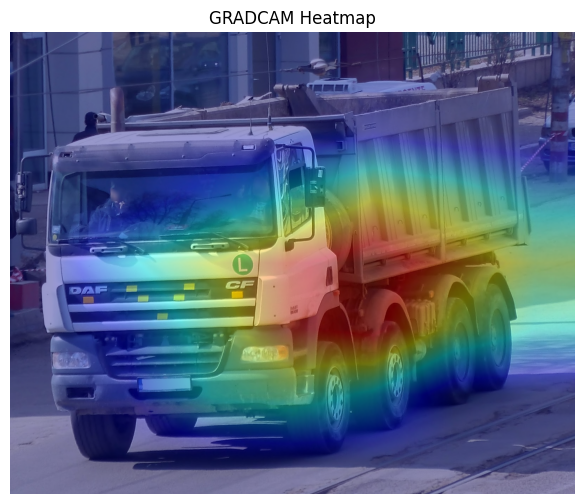

Image 1 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


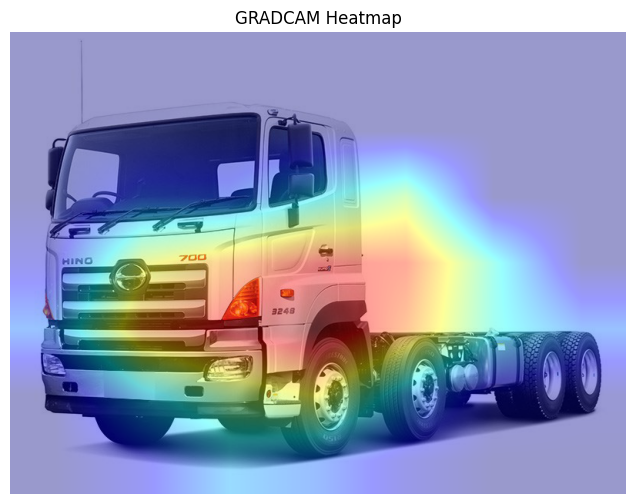

Image 2 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


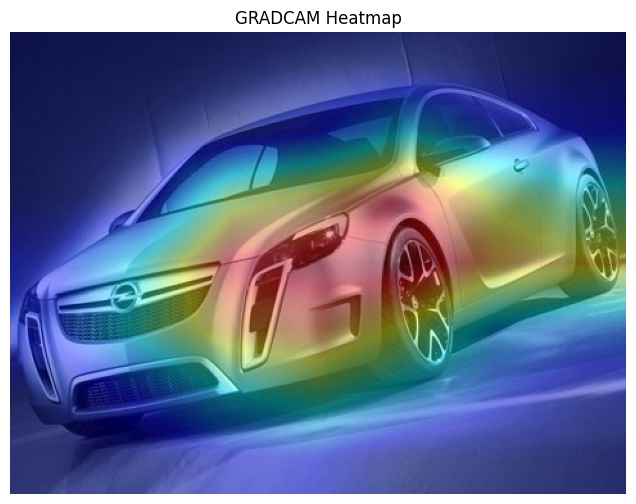

Image 3 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


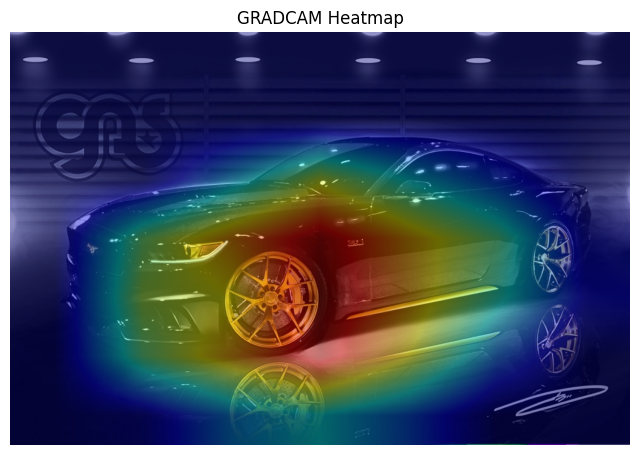

Image 4 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


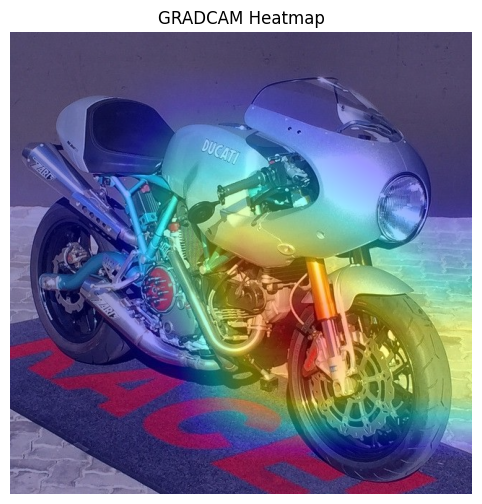

Image 5 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


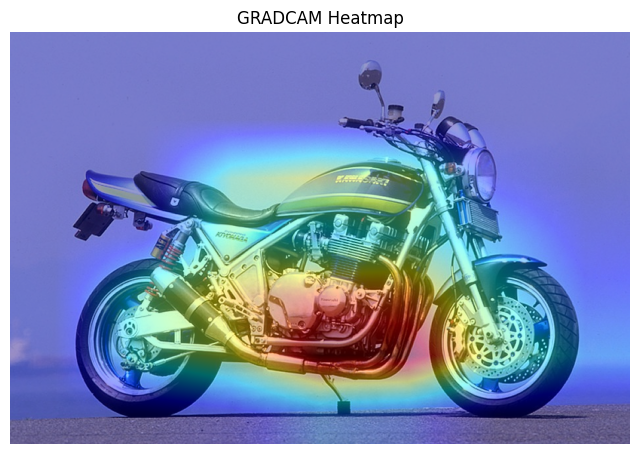

Image 6 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


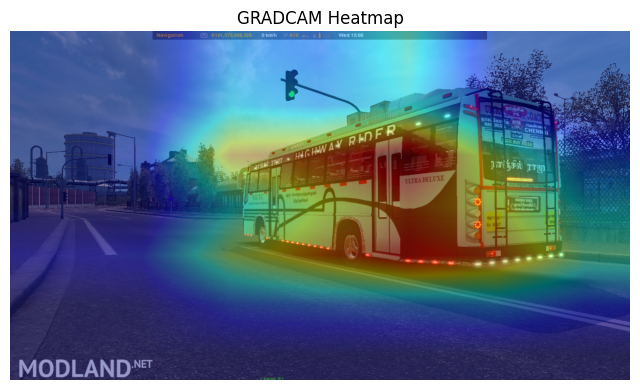

Image 7 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


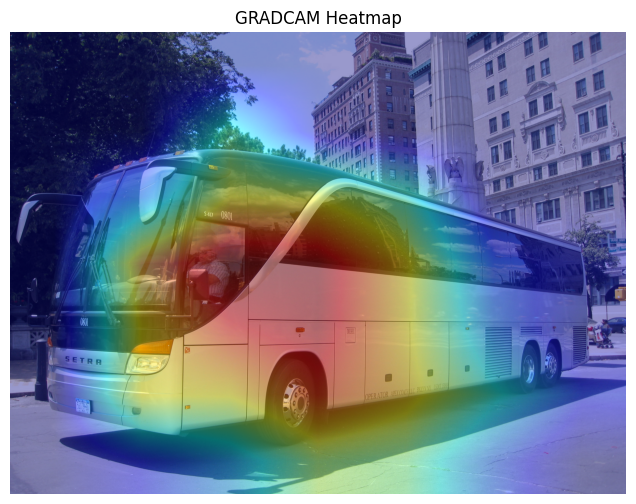

Image 8 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv3



In [108]:
display_cam(
    selected_images=selected_images,
    model=model,
    device=device,
    dataset_labels=dataset_labels,
    algorithm='gradcam',
    layer_name='layer4.2.conv3',
    display_images=True
)

Gradcam tends to focus more on the side/door handle area and (to a lesser extent) the side headlight to identify trucks. It puts a great emphasis on the cargo area.

Interestingly, for cars, the focus also tends to be on the front headlight, but noticeably, the bumper and area around the wheels are highlighted more.

For motorcycles, there is a a greater focus on the exhaust pipes connecting to the engine (to be expected) and the area around the front wheel. This makes sense as these structures are distinct for motorcycles.

For buses, the windows and the base are being brought into focus. For image 2, the front door and side are most focused.



GradCam ++

Analyzing images with GRADCAM++

✓ Hooks registered on layer: layer4.2.conv3


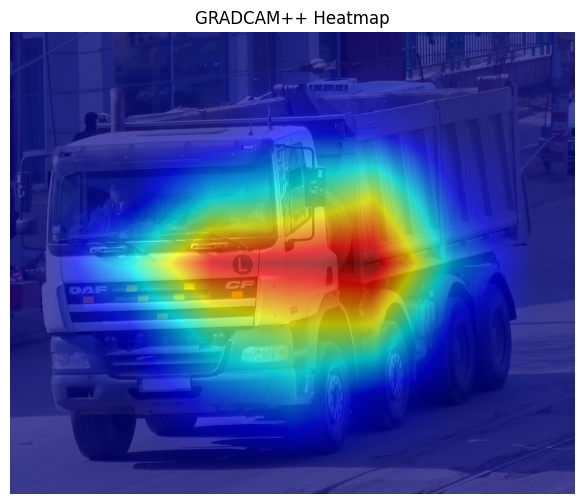

Image 1 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


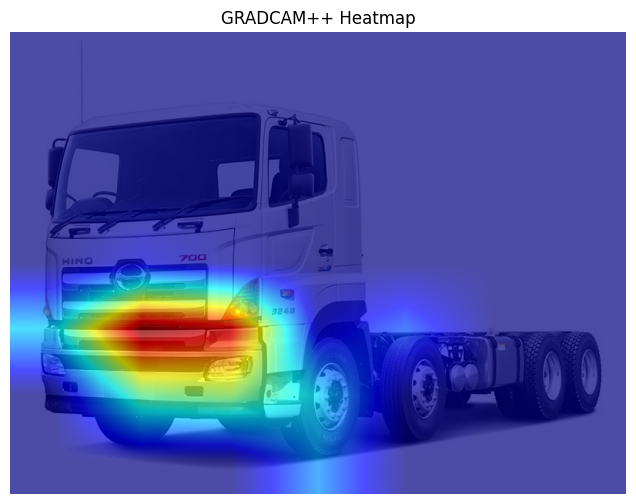

Image 2 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


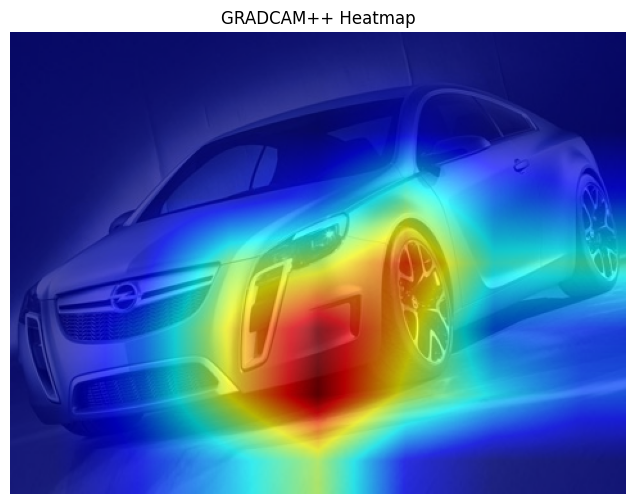

Image 3 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


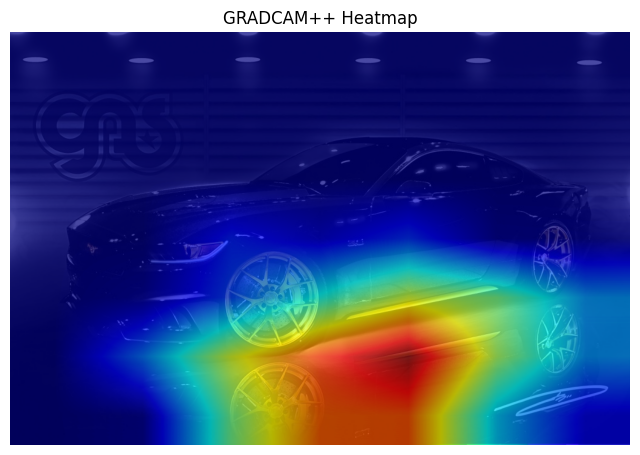

Image 4 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


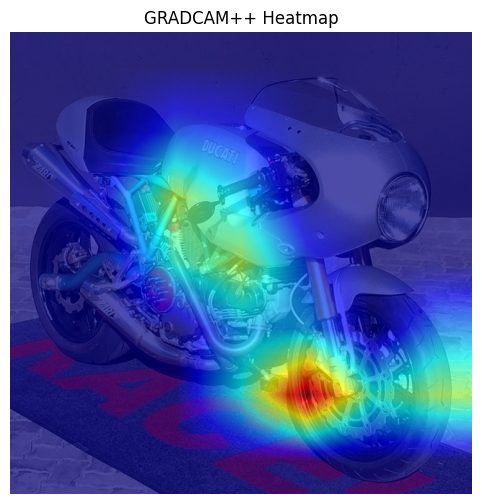

Image 5 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


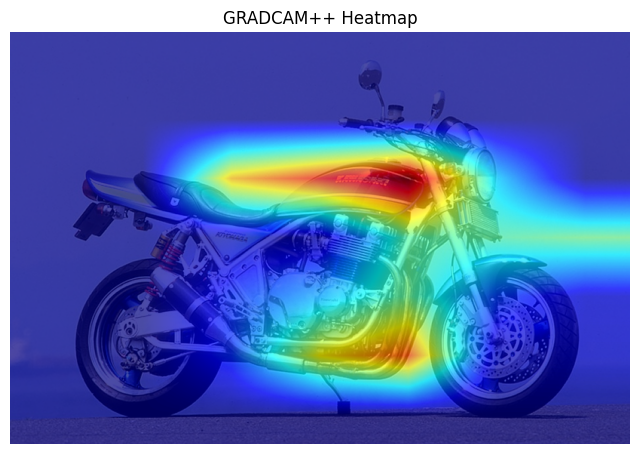

Image 6 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


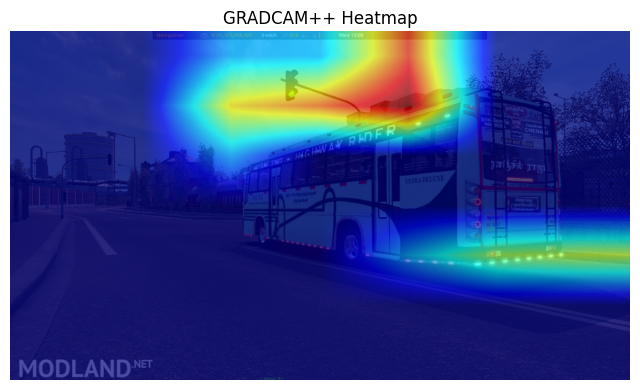

Image 7 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv3

✓ Hooks registered on layer: layer4.2.conv3


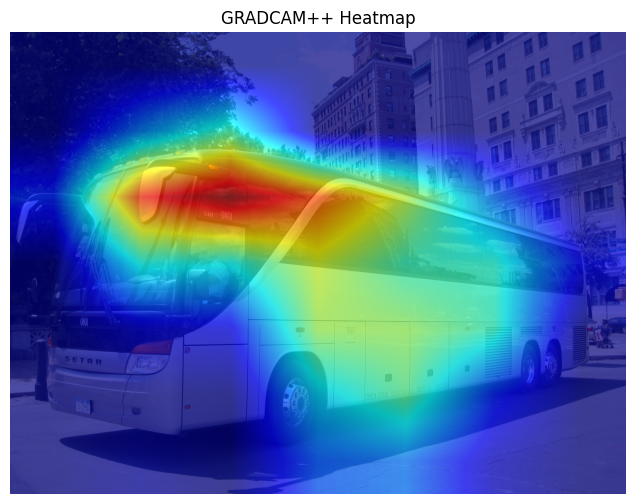

Image 8 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv3



In [103]:
display_cam(
    selected_images=selected_images,
    model=model,
    device=device,
    dataset_labels=dataset_labels,
    algorithm='gradcam++',
    layer_name='layer4.2.conv3',
    display_images=True
)

GradCam++ seems to be much more intentional when it comes to focusing on particular parts of the images.

With trucks, the area brought into focus are the front lights, the door, and the cargo.

With cars, the base structure and the area aroudn the wheels are being brought to focus.  

With motorcycles, the seats and parts of the pipes that connect to the exhaust pipe are bing highlighted.

With buses, the roof/top of the vehicles are focused most. Windows and the back are also highlighted.

In general, GradCam++ tends to focus on more specific and concentrated places in the feature map, which show up in fewer but very precise locations of the images in the overlayed heatmap.


EigenCam

Analyzing images with EIGENCAM

✓ Hooks registered on layer: layer4.2.conv2


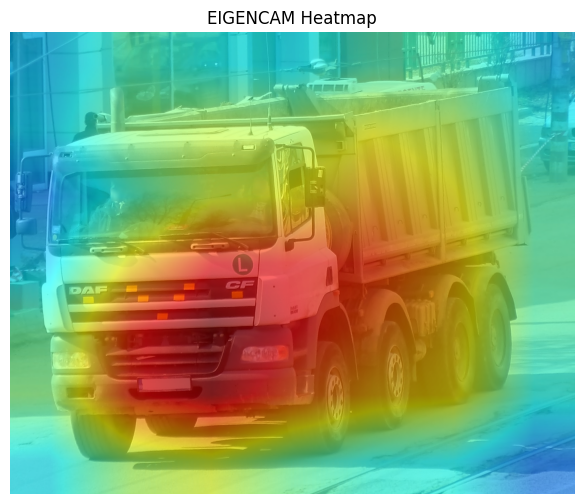

Image 1 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


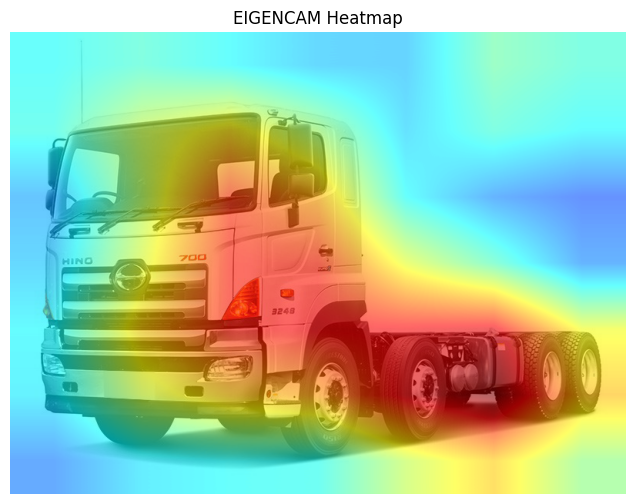

Image 2 (True: "Truck"):
  Correct
 Predicted: "Truck" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


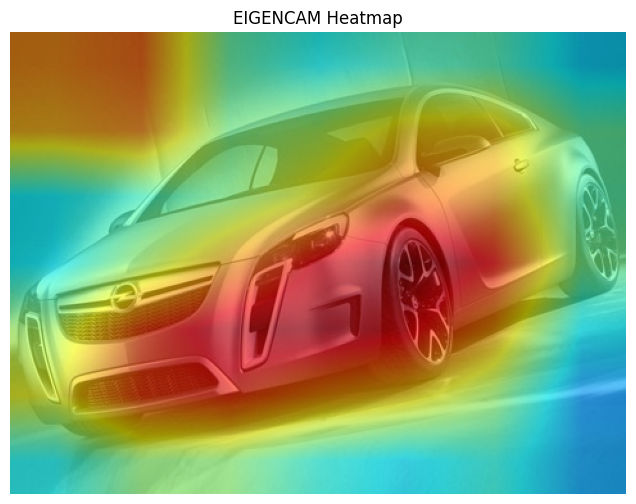

Image 3 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


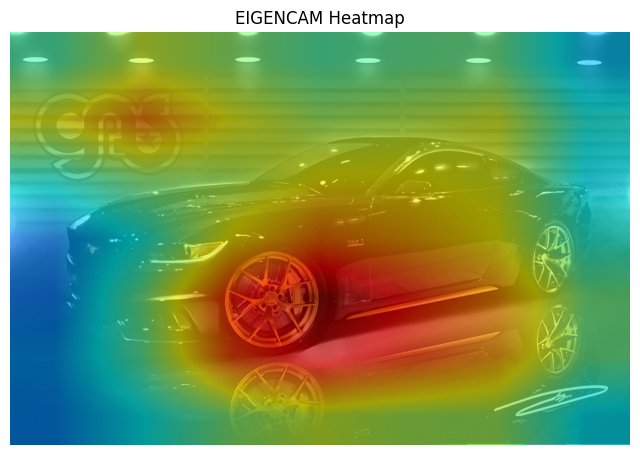

Image 4 (True: "Car"):
  Correct
 Predicted: "Car" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


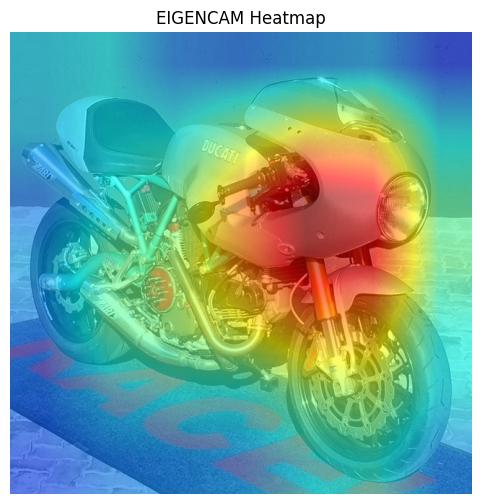

Image 5 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


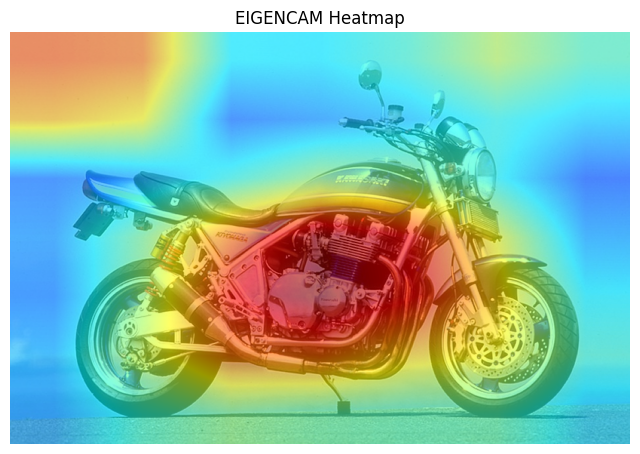

Image 6 (True: "motorcycle"):
  Correct
 Predicted: "motorcycle" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


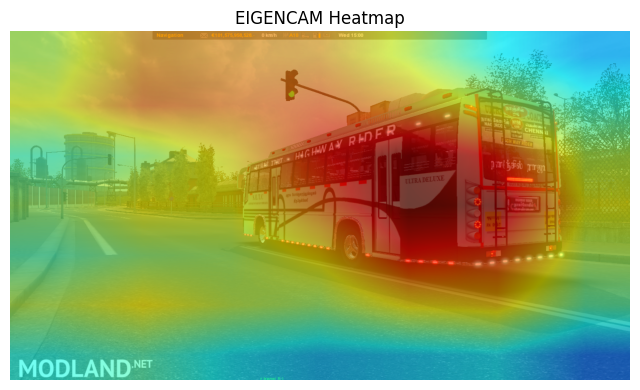

Image 7 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv2

✓ Hooks registered on layer: layer4.2.conv2


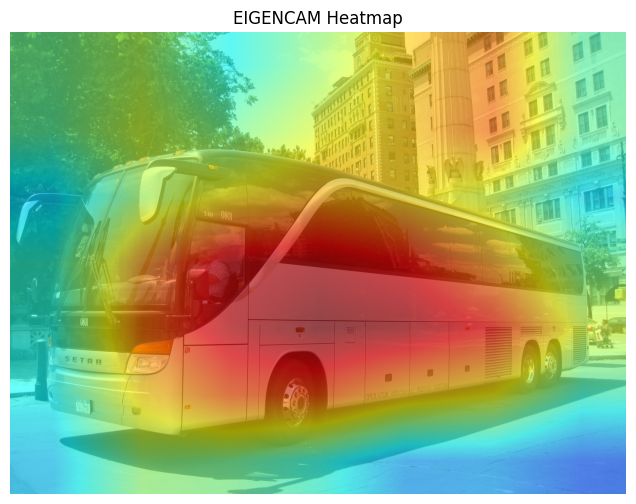

Image 8 (True: "Bus"):
  Correct
 Predicted: "Bus" (conf: 1.000)
  Layer: layer4.2.conv2



In [107]:
display_cam(
    selected_images=selected_images,
    model=model,
    device=device,
    dataset_labels=dataset_labels,
    algorithm='eigencam',
    layer_name='layer4.2.conv2',
    display_images=True
)

EigenCam seems to highlight PCA on feature maps really well. Without the need for the gradient weighting, it focuses on a broader area that humans would typically look at to identify the vehicle type.

With trucks, the shape of the front and headlights, along with the large wheels and the cargo space are most pronounced.

With cars, the base, headlights, and the front wheels are highlighted.

With motorcycles, the engine structure and the area around the handles, plus the suspension, are focused. This is different from GradCam ++, which emphasizes the structure of the motorcycle seat and only parts of the engine pipes.

With buses, the windows and almost the entire side of the buses are highlighted. Interestingly, the backdoor is brought into focus on one of the images, showing the uniqueness of buses.

Lastly, these images show that EigenCam "lights up" more of each image as the warm colors show up in more places. EigenCam also picks on some of the background, as seen for some images (cars, buses, motorcycles), to give additional context for classifying vehicle type. This is a drastic differece from GradCam++ which have hyperfocus on a few key locations.